In [1]:
!pip install geopandas
!pip install contextily

     |████████████████████████████████| 1.0 MB 5.4 MB/s 
     |████████████████████████████████| 6.3 MB 27.2 MB/s 
     |████████████████████████████████| 15.4 MB 30.6 MB/s 
     |████████████████████████████████| 19.3 MB 1.3 MB/s 


In [2]:
import geopandas
import pandas as pd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. visualizzi su una mappa i 10 corsi d'acqua più lunghi della provincia di Milano

In [4]:
comuni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021/Com01012021")
comuni

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,SHAPE_LENG,Shape_Le_1,Shape_Area,geometry
0,1,1,1,201,201,1077,001077,Chiaverano,None,0,18164.369945,18164.236621,1.202212e+07,"POLYGON ((414358.390 5042001.044, 414381.796 5..."
1,1,1,1,201,201,1079,001079,Chiesanuova,None,0,10777.398475,10777.318814,4.118911e+06,"POLYGON ((394621.039 5031581.116, 394716.100 5..."
2,1,1,1,201,201,1089,001089,Coazze,None,0,41591.434852,41591.122092,5.657268e+07,"POLYGON ((364914.897 4993224.894, 364929.991 4..."
3,1,1,1,201,201,1006,001006,Almese,None,0,17058.567837,17058.439037,1.787564e+07,"POLYGON ((376934.962 4999073.854, 376960.555 4..."
4,1,1,1,201,201,1007,001007,Alpette,None,0,9795.635259,9795.562269,5.626076e+06,"POLYGON ((388890.737 5030465.123, 388945.987 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,5,19,82,282,282,82045,082045,Lercara Friddi,None,0,41752.151492,42315.473379,3.749310e+07,"POLYGON ((911026.790 4190436.780, 911110.915 4..."
7899,5,19,82,282,282,82078,082078,Vicari,None,0,0.000000,56126.024420,8.594625e+07,"POLYGON ((903617.640 4186159.573, 903583.834 4..."
7900,2,4,21,0,21,21076,021076,Salorno sulla strada del vino,Salurn an der WeinstraÃe,0,38330.113460,38329.838310,3.312504e+07,"POLYGON ((676383.291 5127075.411, 676424.729 5..."
7901,3,12,58,258,258,58081,058081,Riano,None,0,30941.918435,31158.226031,2.544838e+07,"POLYGON ((791585.579 4667342.828, 791638.892 4..."


In [5]:
corsi_acqua = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/Corsi_acqua_Piano_di_Gestione.zip")
corsi_acqua

,OBJECTID,COD_PTUA16,NATURA,REGIONE,NOME,SOTTOBACIN,TIPOLOGIA,A_PROTETTA,SENSIBILE,VULNERABIL,D_HABITAT,D_UCCELLI,RAMSAR,BALNEAZION,VITA_PESCI,USO_POTAB,AREE_A_PR,BACINO,RAGG_ECO,RAGG_CHI,STATO_ECO,CONF_ECO,STATO_CHI,CONF_CHI,ANNI_CHI,ANNI_ECO,OBB_CHI,OBB_ECO,ESENZIONI,SHAPE_LEN,geometry
0,188,IT03POTI3GRCA1LO,artificiale,Lombardia,Naviglio Grande (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,sufficiente,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,44301.215986,"LINESTRING (480362.262 5040575.220, 480364.627..."
1,191,IT03POTI3SNCA1LO,artificiale,Lombardia,Scolmatore Piene Nord - Ovest (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,34035.857991,"MULTILINESTRING ((494060.091 5029696.046, 4940..."
2,215,IT03N0080447LO,naturale,Lombardia,Lambro (Fiume),Lambro (Asta),06SS4N,sì,sì,sì,no,sì,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,21811.145089,"MULTILINESTRING ((536963.747 5005395.412, 5369..."
3,252,IT03N008044003021LO,naturale,Lombardia,Garbogera (Torrente),Lambro (Asta),06IN7N,sì,no,sì,sì,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,sì,sì,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,19767.119220,"LINESTRING (509280.513 5047845.024, 509281.795..."
4,255,IT03N0080440441LO,naturale,Lombardia,Sillaro Salerano,Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,13180.757122,"LINESTRING (528977.056 5024109.798, 528981.181..."
5,256,IT03N0080440701LO,naturale,Lombardia,Addetta (Colatore),Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,9403.459186,"MULTILINESTRING ((530299.337 5029522.740, 5302..."
6,282,IT03POLSRECA1LO,artificiale,Lombardia,Redefossi (Cavo),nd,06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18403.681560,"LINESTRING (514894.561 5036362.164, 514898.993..."
7,65,ITIRN0080984IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,no,sì,TICINO,no,no,sufficiente,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,38206.257375,"MULTILINESTRING ((483579.882 5034726.498, 4835..."
8,66,ITIRN0080982IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,sì,sì,TICINO,no,no,buono,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,mantenimento dello stato buono,Nessuna proroga o deroga,35927.352062,"MULTILINESTRING ((477067.969 5044605.066, 4770..."
9,67,ITIRN0080983IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,no,sì,TICINO,no,no,buono,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,mantenimento dello stato buono,Nessuna proroga o deroga,17917.785813,"MULTILINESTRING ((477477.600 5043097.081, 4774..."


In [6]:
Province = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021/ProvCM01012021")
Province

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,-,Torino,Torino,TO,Citta metropolitana,593389.667001,6.826908e+09,"POLYGON ((411015.006 5049970.983, 411070.006 5..."
1,1,1,2,0,2,Vercelli,-,Vercelli,VC,Provincia,458754.449021,2.081602e+09,"POLYGON ((437900.552 5088796.204, 437915.021 5..."
2,1,1,3,0,3,Novara,-,Novara,NO,Provincia,276722.284585,1.340250e+09,"POLYGON ((459146.367 5079451.275, 459180.648 5..."
3,1,1,4,0,4,Cuneo,-,Cuneo,CN,Provincia,542063.983810,6.894828e+09,"MULTIPOLYGON (((378928.552 4958539.163, 378934..."
4,1,1,5,0,5,Asti,-,Asti,AT,Provincia,356521.052241,1.510170e+09,"POLYGON ((423634.299 4998152.373, 423642.986 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,1,1,103,0,103,Verbano-Cusio-Ossola,-,Verbano-Cusio-Ossola,VB,Provincia,316521.773202,2.260887e+09,"POLYGON ((456874.626 5145767.794, 456879.627 5..."
103,1,3,108,0,108,Monza e della Brianza,-,Monza e della Brianza,MB,Provincia,164691.454327,4.054079e+08,"POLYGON ((519686.705 5065270.380, 519754.706 5..."
104,3,11,109,0,109,Fermo,-,Fermo,FM,Provincia,226568.225869,8.627532e+08,"POLYGON ((885062.265 4803844.694, 885197.764 4..."
105,4,16,110,0,110,Barletta-Andria-Trani,-,Barletta-Andria-Trani,BT,Provincia,276175.124779,1.542990e+09,"POLYGON ((1081237.144 4611047.023, 1081399.393..."


In [8]:
milano = Province[Province["DEN_UTS"] == "Milano"]
milano

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
14,1,3,15,215,215,-,Milano,Milano,MI,Citta metropolitana,380893.020651,1.575488e+09,"MULTIPOLYGON (((537246.884 5005401.324, 537204..."


In [9]:
corsi_milano = corsi_acqua[corsi_acqua.within(milano.geometry.squeeze())]
corsi_piu_lunghi = corsi_milano.nlargest(10, "SHAPE_LEN")
corsi_piu_lunghi

,OBJECTID,COD_PTUA16,NATURA,REGIONE,NOME,SOTTOBACIN,TIPOLOGIA,A_PROTETTA,SENSIBILE,VULNERABIL,D_HABITAT,D_UCCELLI,RAMSAR,BALNEAZION,VITA_PESCI,USO_POTAB,AREE_A_PR,BACINO,RAGG_ECO,RAGG_CHI,STATO_ECO,CONF_ECO,STATO_CHI,CONF_CHI,ANNI_CHI,ANNI_ECO,OBB_CHI,OBB_ECO,ESENZIONI,SHAPE_LEN,geometry
0,188,IT03POTI3GRCA1LO,artificiale,Lombardia,Naviglio Grande (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,sufficiente,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,44301.215986,"LINESTRING (480362.262 5040575.220, 480364.627..."
31,501,IT03POLSSEMACA1LO,artificiale,Lombardia,Naviglio Martesana (Canale),nd,None,sì,no,sì,no,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,38123.487110,"LINESTRING (541227.887 5050214.931, 541227.203..."
1,191,IT03POTI3SNCA1LO,artificiale,Lombardia,Scolmatore Piene Nord - Ovest (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,34035.857991,"MULTILINESTRING ((494060.091 5029696.046, 4940..."
32,398,IT03POTI3NPCA1LO,artificiale,Lombardia,Naviglio Pavese (Canale),nd,None,sì,no,sì,no,no,no,no,no,no,no,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,33448.858573,"LINESTRING (513927.378 5033222.100, 513927.258..."
35,565,IT03POAD3VACA1LO,artificiale,Lombardia,Vailata (Roggia),nd,None,sì,no,sì,no,no,no,no,no,no,sì,ADDA,no,no,sufficiente,media,non buono,media,2012-2014,2012-2014,buono al 2021,buono al 2021,Art. 4.4 per obiettivo ecologico e chimico,20751.104448,"LINESTRING (541818.985 5047325.989, 541818.901..."
28,448,IT03N008001091014LO,naturale,Lombardia,Seveso (Torrente),Seveso,06SS3D,sì,no,sì,no,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,no,no,cattivo,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18469.448374,"LINESTRING (512157.688 5048463.394, 512157.976..."
6,282,IT03POLSRECA1LO,artificiale,Lombardia,Redefossi (Cavo),nd,06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18403.681560,"LINESTRING (514894.561 5036362.164, 514898.993..."
44,676,IT03N0080981411LO,naturale,Lombardia,Navigliaccio (Colatore),Ticino Sub Lacuale,06SS1N,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,NC,None,NC,None,2014,2014,buono al 2021,buono al 2021,Art. 4.4 per obiettivo ecologico e chimico,18105.747329,"LINESTRING (507915.612 5019743.337, 507917.175..."
27,358,IT03N008044002014LO,naturale,Lombardia,Olona (Fiume),Olona,06SS3D,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,cattivo,alta,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,15816.452967,"LINESTRING (504109.620 5040607.275, 504113.432..."
41,653,IT03N00804100201071LO,naturale,Lombardia,Guisa (Torrente),Olona,06IN7N,sì,no,sì,sì,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,sì,sì,cattivo,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,15724.066747,"MULTILINESTRING ((507313.752 5043557.731, 5073..."


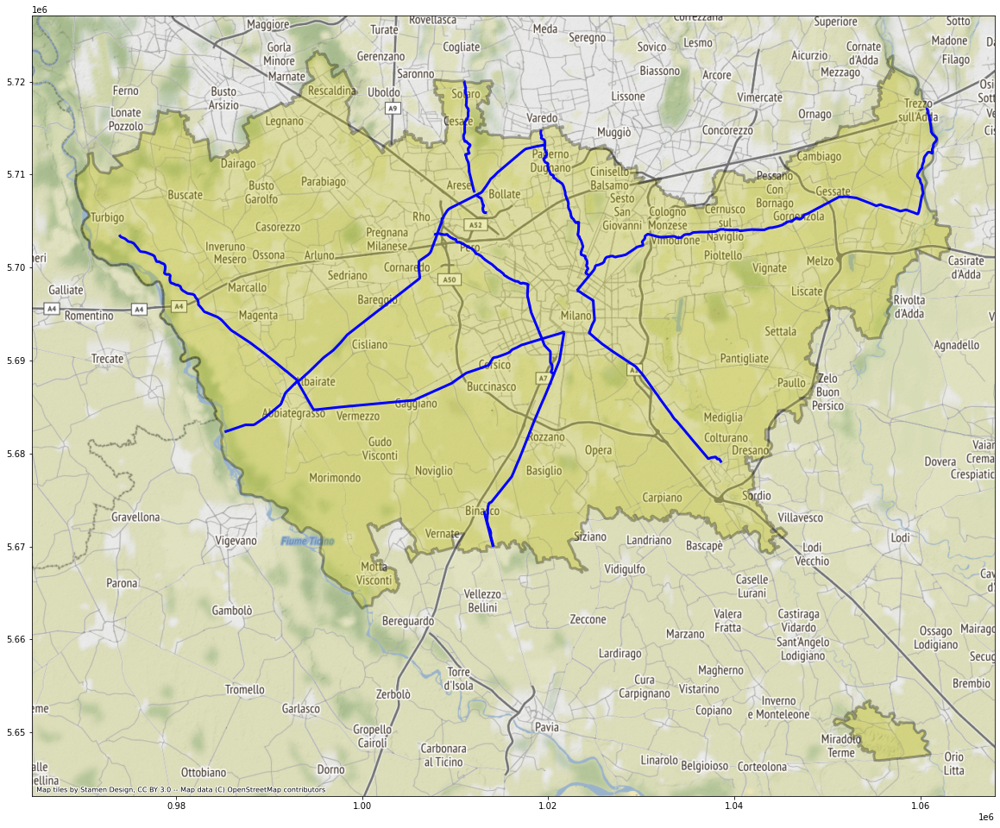

In [11]:
ax = corsi_piu_lunghi.to_crs(epsg=3857).plot(figsize= (20, 20), edgecolor="b", linewidth=3)
milano.to_crs(epsg=3857).plot(ax=ax, facecolor= "y",alpha = 0.3, linewidth= 3, edgecolor= "k")
contextily.add_basemap(ax=ax)

2. visualizzi su una mappa i Navigli e i fiumi da cui prendono l'acqua. Utilizzare colori diversi per rappresentare i navigli rispetto ai fiumi ed evidenziare bene i percorsi sulla mappa

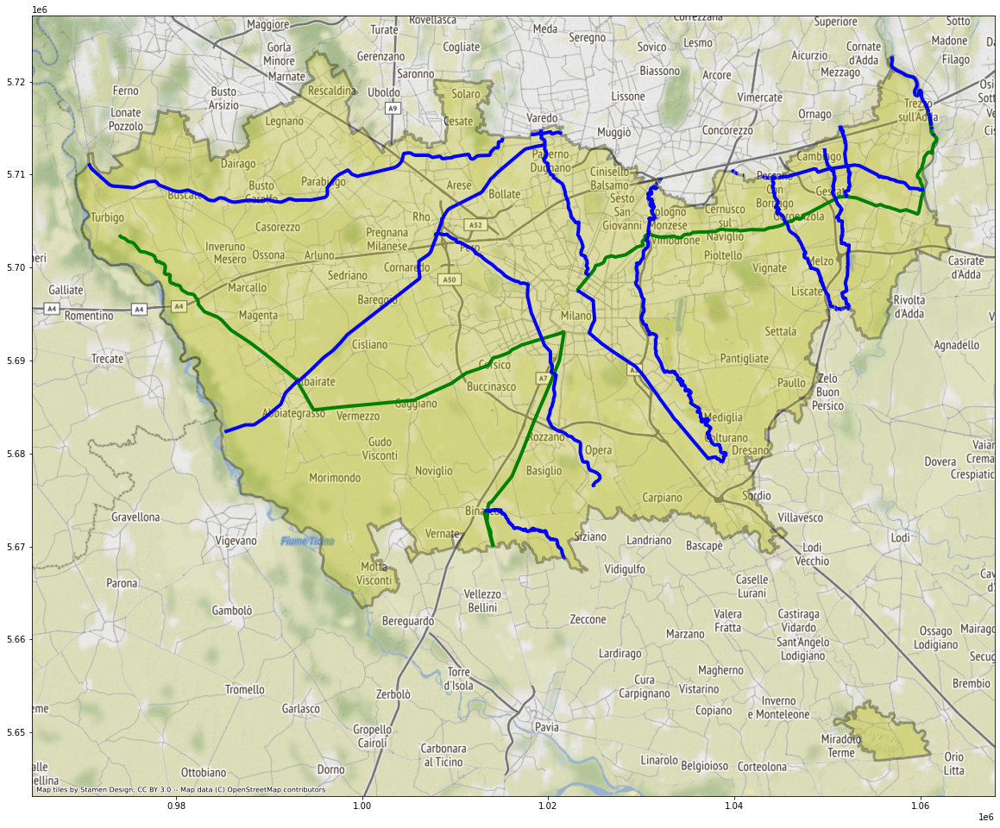

In [12]:
navigli = corsi_acqua[corsi_acqua["NOME"].str.contains("Navigl")]

fiumi = corsi_acqua[corsi_acqua.intersects(navigli.geometry.squeeze().unary_union)]

fiumi = fiumi[~fiumi["NOME"].str.contains("Navigl")]
ax = milano.to_crs(epsg=3857).plot(figsize=(20,20), facecolor= "y",alpha = 0.3, linewidth= 3, edgecolor= "k")
navigli.to_crs(epsg=3857).plot(ax=ax, linewidth= 4, edgecolor= "g")
fiumi.to_crs(epsg=3857).plot(ax=ax, linewidth= 4, edgecolor= "b")

contextily.add_basemap(ax=ax)

3. visualizzi su una mappa i corsi d'acqua che passano in un comune inserito dall'utente

Inserisci il nome di un comune: Milano
i parchi ospitati all'interno di questo comune sono: 
 0          Naviglio Grande (Canale)
3              Garbogera (Torrente)
6                  Redefossi (Cavo)
11               Merlata (Torrente)
14                Pudica (Torrente)
16                 Vettabbia (Cavo)
17                   Lambro (Fiume)
27                    Olona (Fiume)
28                Seveso (Torrente)
31      Naviglio Martesana (Canale)
32         Naviglio Pavese (Canale)
39    Lambro Meridionale (Colatore)
Name: NOME, dtype: object


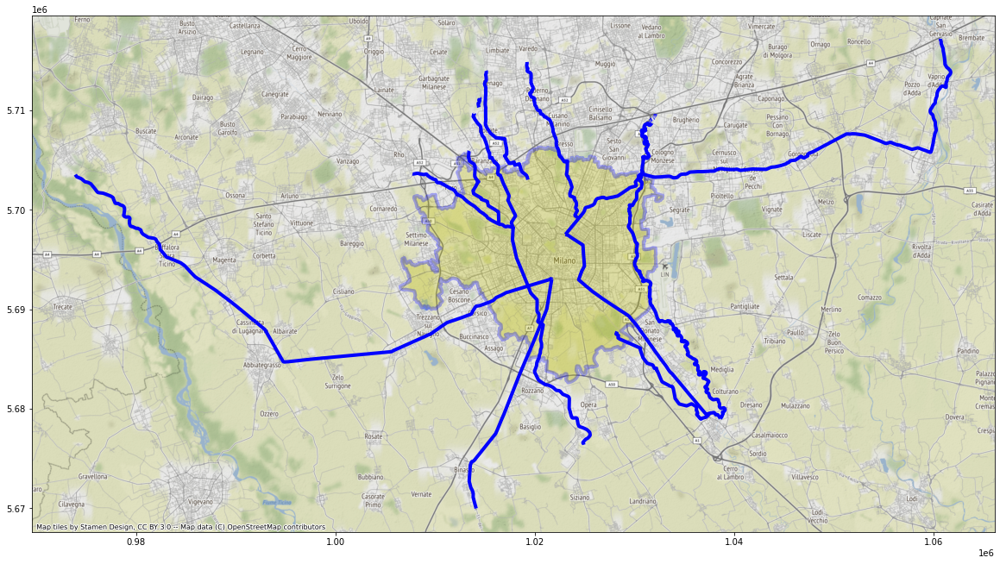

In [13]:
nome_comune = input("Inserisci il nome di un comune: ")
comune = comuni[comuni["COMUNE"] == nome_comune]
squeeze_comune = comune.geometry.squeeze()

corsi_attra_milano =  corsi_acqua[corsi_acqua.intersects(squeeze_comune)]
corsi_attra_milano

print("i parchi ospitati all'interno di questo comune sono: \n", corsi_attra_milano.NOME)

ax = comune.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "y",alpha = 0.3, edgecolor = "b", linewidth = 4)
corsi_attra_milano.to_crs(epsg = 3857).plot(ax = ax ,linewidth=4, edgecolor = "b" )
contextily.add_basemap(ax=ax)

4. visualizzi su una mappa un fiume inserito dall'utente con tutti i comuni  che attraversa. Se attraversa Milano, visualizzare solo i quartieri che attraversa

Inserire il nome di un fiume: Naviglio Martesana (Canale)


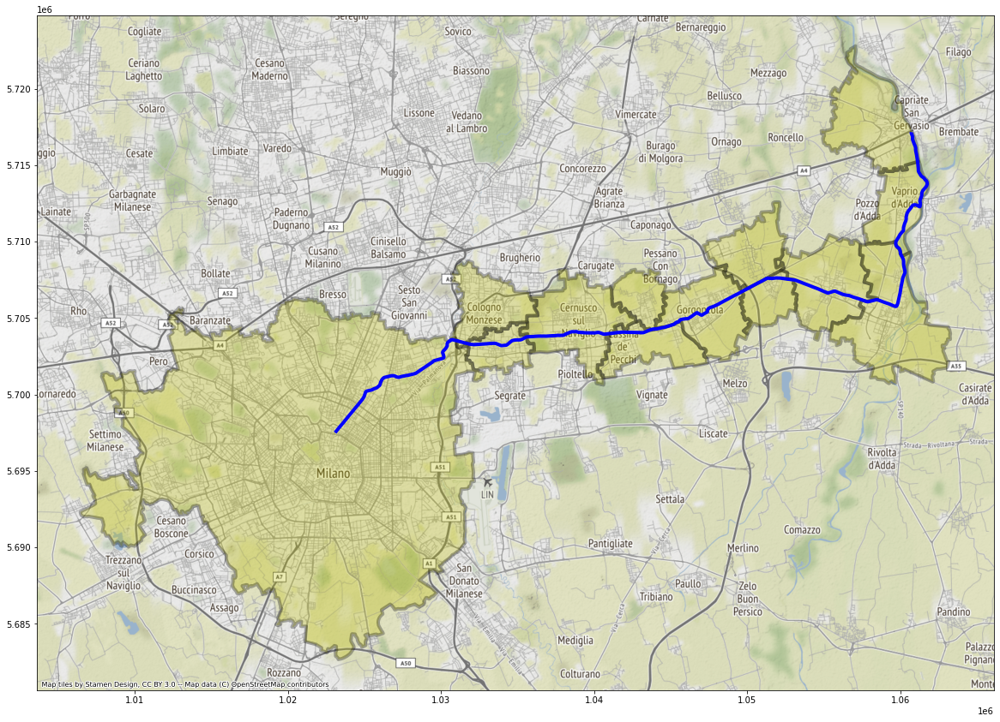

In [16]:
nome_fiume = input("Inserire il nome di un fiume: ")
fiume = corsi_acqua[corsi_acqua["NOME"] == nome_fiume]
squeeze_fiume = fiume.geometry.squeeze()

comuni_attra_fiume =  comuni[comuni.intersects(squeeze_fiume)]
comuni_attra_fiume

ax = fiume.to_crs(epsg = 3857).plot(figsize=(20,20), edgecolor = "b", linewidth = 4)
comuni_attra_fiume.to_crs(epsg = 3857).plot(ax = ax, facecolor = "y", alpha = 0.3 ,linewidth=4, edgecolor = "k" )
contextily.add_basemap(ax=ax)

5. visualizzi il numero di corsi d'acqua della provincia di Milano e la lunghezza totale di tutti i corsi d'acqua

0     41227.965428
1     34035.857991
5      9403.459186
6     18403.681560
11     6596.411258
12    14141.256453
14    10073.652302
16    10660.764389
19     1480.247324
27    15816.452967
28    13194.218631
29     8204.459878
31    38123.487110
32    17630.753081
33     9587.820244
35        1.064125
37    14562.124392
39    11169.001938
41    11148.573320
44     2782.189886
dtype: float64


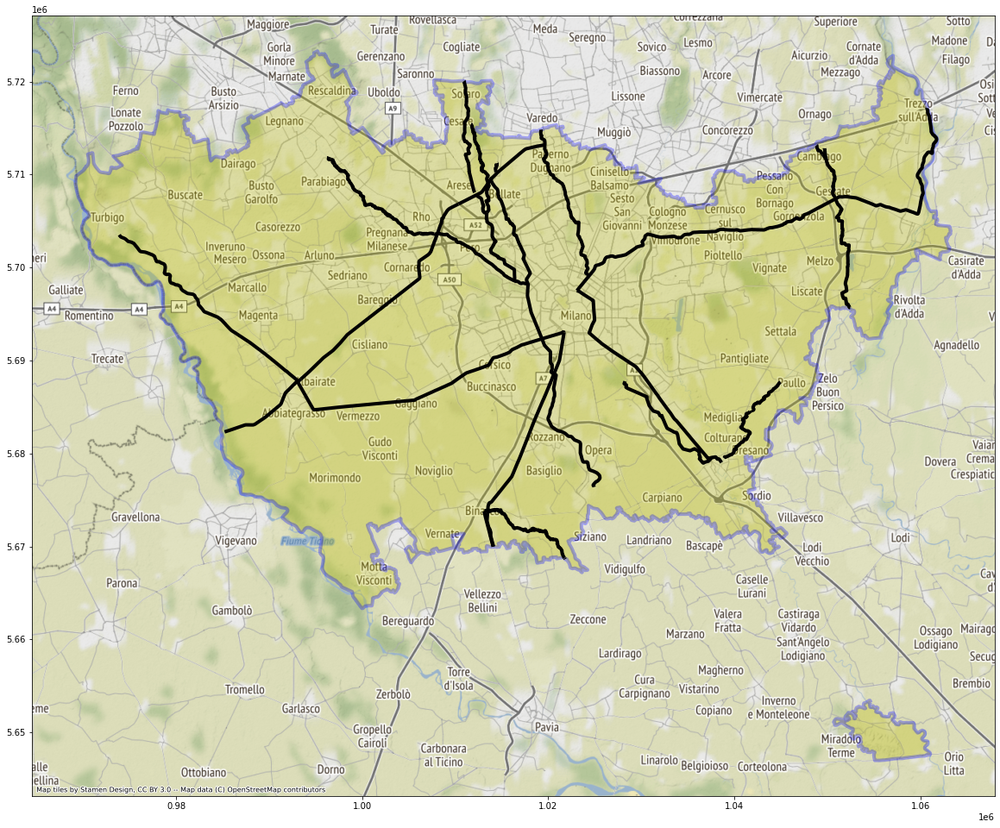

In [14]:
corsi_acqua_milano = corsi_acqua[corsi_acqua.within(milano.geometry.squeeze())]
lun_corsi_acqua_milano = corsi_acqua_milano.length


print(lun_corsi_acqua_milano)

ax = milano.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "y", alpha= 0.3, edgecolor = "b", linewidth = 4)
corsi_acqua_milano.to_crs(epsg = 3857).plot(ax = ax,linewidth=4, edgecolor = "k" )
contextily.add_basemap(ax=ax)

6. visualizzi su unamappa i comuni della provincia di Milano che non sono attraversati da corsi d'acqua

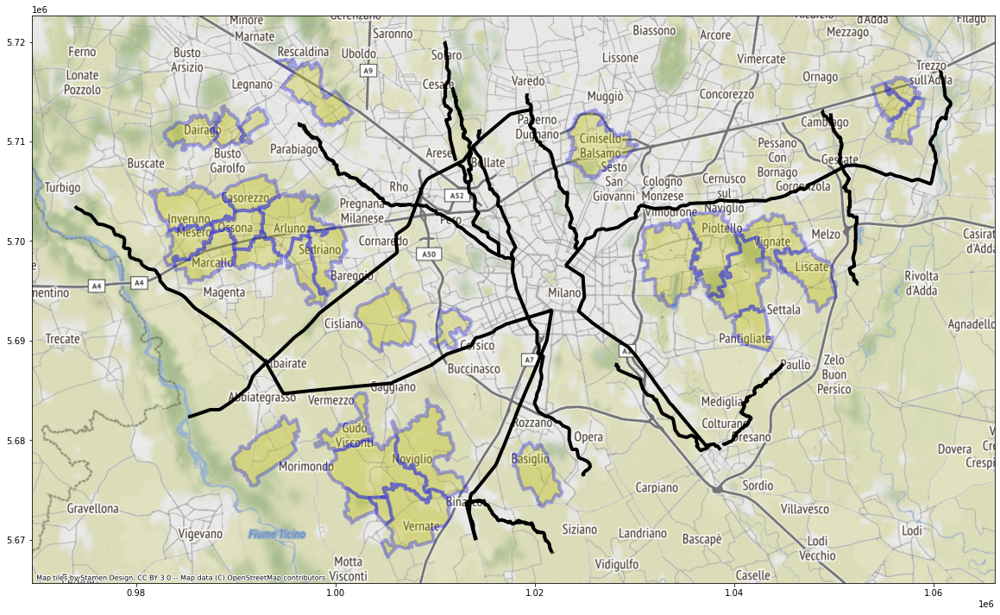

In [15]:
comuni_milano = comuni[comuni.within(milano.geometry.squeeze())]

comuni_non_attra = comuni_milano[~comuni_milano.intersects(corsi_acqua.geometry.squeeze().unary_union)]


ax = comuni_non_attra.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "y", alpha= 0.3, edgecolor = "b", linewidth = 4)
corsi_acqua_milano.to_crs(epsg = 3857).plot(ax = ax,linewidth=4, edgecolor = "k" )
contextily.add_basemap(ax=ax)